# **Final Project - Emotion Classification of Tweets: CSCI E89b - NLP**

**Yuvraj Puri**

## Load Data

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split


%matplotlib inline

In [6]:
import nltk
import string
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

from sklearn.feature_extraction.text import TfidfVectorizer
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


nltk.download("stopwords")


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [7]:
import warnings
warnings.filterwarnings('ignore')

Upload onto colab (archive6)

In [8]:
data = pd.read_parquet('train-00000-of-00001.parquet')

In [9]:
data.head()

,text,label
0,i feel awful about it too because it s my job ...,0
1,im alone i feel awful,0
2,ive probably mentioned this before but i reall...,1
3,i was feeling a little low few days back,0
4,i beleive that i am much more sensitive to oth...,2


In [10]:
data.isnull().sum()

,0
text,0
label,0


In [11]:
print(data.label.value_counts())
print(data.dtypes)


label
1    141067
0    121187
3     57317
4     47712
2     34554
5     14972
Name: count, dtype: int64
text     object
label     int64
dtype: object


**Information about the dataset**:

`text`: a string feature representing the tweet.

`label`: a classification label with the following values:


0.   sadness
1.   joy
2.   love
3.   anger
4.   fear
5.   surprise








In [12]:
# Emotion map for the numeric labels
emotion_map = {
    0: 'sadness',
    1: 'joy',
    2: 'love',
    3: 'anger',
    4: 'fear',
    5: 'surprise'
}

data['emotion'] = data['label'].map(emotion_map)

In [13]:
data

,text,label,emotion
0,i feel awful about it too because it s my job ...,0,sadness
1,im alone i feel awful,0,sadness
2,ive probably mentioned this before but i reall...,1,joy
3,i was feeling a little low few days back,0,sadness
4,i beleive that i am much more sensitive to oth...,2,love
...,...,...,...
416804,that was what i felt when i was finally accept...,1,joy
416805,i take every day as it comes i m just focussin...,4,fear
416806,i just suddenly feel that everything was fake,0,sadness
416807,im feeling more eager than ever to claw back w...,1,joy


In [14]:
print(data.emotion.value_counts())
print(data.shape)

emotion
joy         141067
sadness     121187
anger        57317
fear         47712
love         34554
surprise     14972
Name: count, dtype: int64
(416809, 3)


## EDA, Data Preprocessing, Simple Sentiment Analysis

### EDA - Exploratory Data Analysis

We'll get some simple data for now about the data.

#### Exploring distribution of tweets by label

In [15]:
# Percentage of emotions making up the dataset
data.emotion.value_counts() / data.shape[0] *100

,count
emotion,
joy,33.844519
sadness,29.074948
anger,13.751383
fear,11.446970
love,8.290128
surprise,3.592053


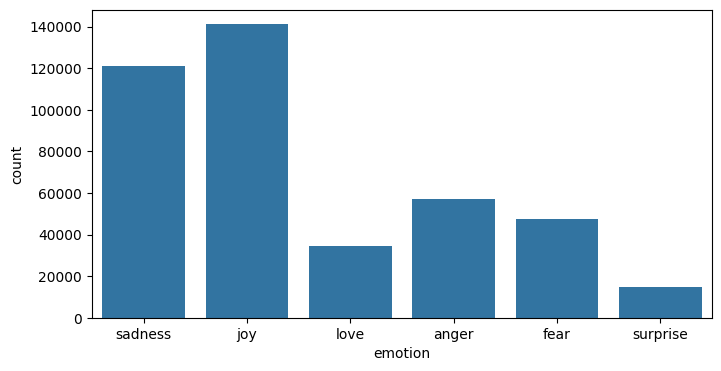

In [16]:

plt.figure(figsize=(8,4))
sns.countplot(x='emotion', data=data);

#### Exploring character counts of tweets

Let us feature engineer and find the unprocessed character count of each tweet. There used to be a number of Tweet character limit of about 140 characters for Tweets which has since changed. We'll begin our investigation on Tweet character count with that old limit in mind.

In [17]:
# Get character counts of all tweets
data['character_count'] = data['text'].apply(len)
print(data['character_count'].head())


0    112
1     21
2    152
3     40
4     99
Name: character_count, dtype: int64


In [18]:
# Old character limit for tweets was 140 characters.
# Count tweets with character counts greater than 140
count_long_tweets = data[data['character_count'] > 140].shape[0]
count_short_tweets = data[data['character_count'] <= 140].shape[0]
print(f"Number of tweets with character counts greater than 140: {count_long_tweets}")
print(f"Number of tweets with character counts less than 140: {count_short_tweets}")

Number of tweets with character counts greater than 140: 83132
Number of tweets with character counts less than 140: 333677


Some tweets are much longer than 140 characters long. Let's look at the distribution of character counts.

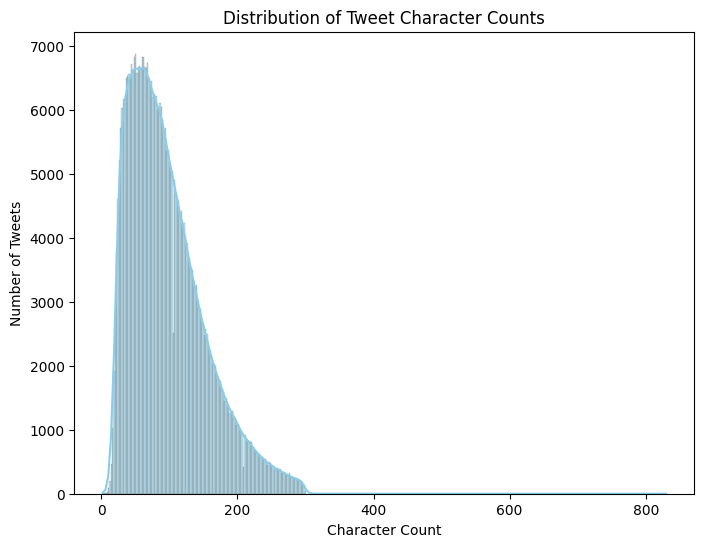

In [19]:
# Plot the distribution of character counts
plt.figure(figsize=(8, 6))
sns.histplot(data['character_count'], kde=True, color='skyblue')
plt.title('Distribution of Tweet Character Counts')
plt.xlabel('Character Count')
plt.ylabel('Number of Tweets')
plt.show()

In [20]:
# Univariate statistics of character count
median = data['character_count'].median()
mean = data['character_count'].mean()
mode = data['character_count'].mode()

In [21]:
print(f"Median character count: {median}")
print(f"Mean character count: {mean}")
print(f"Most common character count: {mode.iloc[0]}")
print(f"Minimum character count: {data['character_count'].min()}")
print(f"Maximum character count: {data['character_count'].max()}")

Median character count: 86.0
Mean character count: 97.02839669968739
Most common character count: 50
Minimum character count: 2
Maximum character count: 830


Let's repeat this for word / token count as well.

In [22]:
copy2 = data.copy()
copy2['token_length'] = copy2['text'].apply(lambda x : len(x.split(" ")))


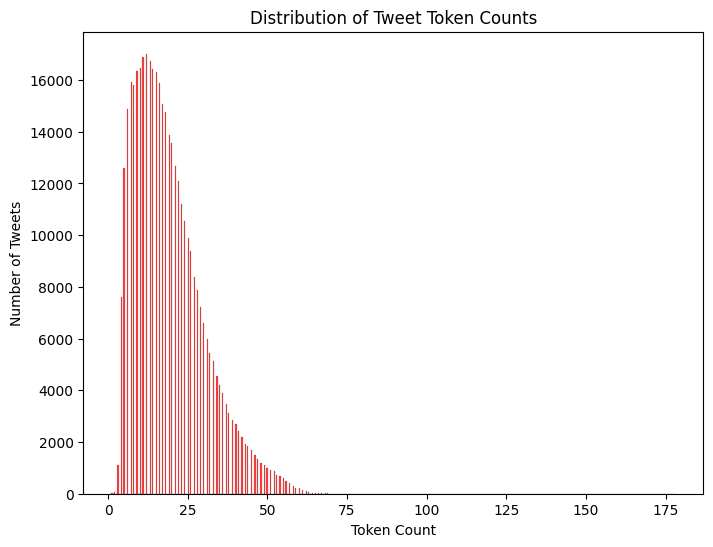

In [23]:
plt.figure(figsize=(8, 6))
sns.histplot(copy2['token_length'], kde=False, color='red')
plt.title('Distribution of Tweet Token Counts')
plt.xlabel('Token Count')
plt.ylabel('Number of Tweets')
plt.show()

In [24]:
# Univariate statistics for token count
median = copy2['token_length'].median()
mean = copy2['token_length'].mean()
mode = copy2['token_length'].mode()

In [25]:
print(f"Median token count: {median}")
print(f"Mean token count: {mean}")
print(f"Most common token count: {mode.iloc[0]}")
print(f"Minimum token count: {copy2['token_length'].min()}")
print(f"Maximum token count: {copy2['token_length'].max()}")

Median token count: 17.0
Mean token count: 19.211015117235952
Most common token count: 12
Minimum token count: 1
Maximum token count: 178


There's an incredible right-sided skew for our character count distribution (see the longest Tweet length above) and our token count distribution.

We may consider adjusting the data for outliers in tweet length, though we're using the textual data itself and not the actual length of them. They will be affected by preprocessing steps so we'll retain all the tweets here.

In [26]:
percentile_95 = data['character_count'].quantile(0.95)

# Filter the tweets with character counts greater than or equal to the 95th percentile
top_5_percent_tweets = data[data['character_count'] >= percentile_95]

# Display the top 5% longest tweets
print(f"Number of tweets in the top 10% longest tweets: {top_5_percent_tweets.shape[0]}")
print(f"Minimum length for top 10% of longest tweets: {int(percentile_95)} characters")

Number of tweets in the top 10% longest tweets: 21084
Minimum length for top 10% of longest tweets: 209 characters


The top 5% of longest tweets are at least 209 characters in length. About 21084 tweets are at least 209 characters long, which is roughly 5% of all the tweets in the dataset.

In [27]:
print(top_5_percent_tweets.emotion.value_counts(),"\n")
print(top_5_percent_tweets.emotion.value_counts() / top_5_percent_tweets.shape[0] * 100)

emotion
joy         7106
sadness     5666
anger       3014
fear        2413
love        2105
surprise     780
Name: count, dtype: int64 

emotion
joy         33.703282
sadness     26.873459
anger       14.295200
fear        11.444697
love         9.983874
surprise     3.699488
Name: count, dtype: float64


Almost the same distribution of tweets as the training, full, and test sets.

Finally, lets look at the tweets that have exceeded the current max character limit of 280 characters per tweet.

In [31]:
# Find the tweets with more than 280 characters.
maxlimit = data[data['character_count'] > 280]
print(f"Number of tweets with more than 280 characters: {maxlimit.shape[0]}")


Number of tweets with more than 280 characters: 2096


Perhaps 2096 tweets came from premium users of Twitter (Twitter Blue subscribers) as they can exceed this character length or came from Twitter Notes or even Twitlonger.

### Preprocessing Considerations

**Before putting the data through its paces, we need to clean / preprocess it.**

Cleaning the data steps we will take include:
*   Checking for duplicates
*   Removing non-alphanum
* Lowercase
* Lemmatizing
* Remove stopwords
* Checking for URLs



#### URLs, HTML Attributes, Metadata

Let's check for URLs or remnants of metadata, HTML attributes, or tracking scripts that can appear when data is scraped or improperly parsed. We'll use a small section of them.

In [33]:
# List of potential HTML attribute words words to remove
import re
words_to_remove = [
    "nofollow", "pagetitle", "permalink", "isprivate", "ismobile", "utf", "feedlinks",
    "languagedirection", "heightpx", "disqus", "itemprop", "middot", "href", "https",
    "eqafe", "www", "aligncenter", "addthisurl", "itemtype", "libtitle", "rightpx",
    "widthpx", "xid", "tinyurl", "http", "newrhinegargoyle", "metadescription",
    "javascriptpagetracker", "calibri", "accesskey", "async", "autocomplete", "autoplay",
    "autofocus", "bgcolor", "charset", "cols", "colspan", "contenteditable", "coords",
    "datetime", "dir", "dirname", "dropzone", "enctype", "hreflang", "ismap", "maxlength",
    "novalidate","oncopy", "onkeypress", "onmousedown", "onscroll", "rowspan", "srclang",
    "tabindex"
]

# Create a regex pattern that matches any of the words
pattern = r'\b(?:' + '|'.join(map(re.escape, words_to_remove)) + r')\b'


In [34]:
copy = data.copy()

In [35]:
URL_rows = copy[copy['text'].str.contains(pattern, na=False)]
URL_rows.head()

,text,label,emotion,character_count
120,i feel honoured and excited to introduce the i...,1,joy,119
121,i don t feel gentle a href http www,2,love,35
253,i feel a little sentimental about and will pro...,0,sadness,154
350,i finally admit im feeling sorry for myself im...,0,sadness,66
352,i have myself fallen victim to the sheltering ...,0,sadness,156


In [36]:
URL_rows.iloc[0]['text']

'i feel honoured and excited to introduce the incredibly nice very well travelled and oh so stylish a href http silkyway'

In [37]:
# Apply the pattern to all string columns
URL_rows = URL_rows.applymap(lambda x: re.sub(pattern, '', x) if isinstance(x, str) else x)

# Remove any extra spaces that may result from word removal
URL_rows = URL_rows.applymap(lambda x: re.sub(r'\s+', ' ', x).strip() if isinstance(x, str) else x)

URL_rows.iloc[0]['text']

'i feel honoured and excited to introduce the incredibly nice very well travelled and oh so stylish a silkyway'

These unnecessary data have been removed. We'll make the changes to all the data now.

In [38]:
data = data.applymap(lambda x: re.sub(pattern, '', x) if isinstance(x, str) else x)

data = data.applymap(lambda x: re.sub(r'\s+', ' ', x).strip() if isinstance(x, str) else x)

In [ ]:
data.iloc[120]['text']

'i feel honoured and excited to introduce the incredibly nice very well travelled and oh so stylish a silkyway'

#### Duplicates

**If we find duplicates in the data, we'll act on whether or not we should remove them from the data.**

We'll need to take a look at these duplicates. What we have essentially found are the exact same texts multiple times in both sets. If we were to check for duplicates in the full dataset (`data`)...

In [40]:
dup_data = data.duplicated().sum()
print(f"Duplicate count in full data: {dup_data}")
print(f"Proportion of full data: {(dup_data / data.shape[0])*100:.4f}%")

Duplicate count in full data: 686
Proportion of full data: 0.1646%


In [41]:
dup_text = data['text'].duplicated().sum()
print(f"Duplicate count in full text-only data: {dup_text}")
print(f"Proportion of full text-only data: {(dup_text / data.shape[0])*100:.4f}%")

Duplicate count in full text-only data: 23004
Proportion of full text-only data: 5.5191%


The count of duplicates is surprisingly low for a dataset of over 400000 tweets - this is because this refers to the data that has the exact same `text`and `label`.

However, when we look at only the text data, we find multiple instances of the exact same text.

This disparity means that there are potentially multiple instances within the full dataset that have **the exact same text but different labels.**



---







The labels are different for some of the duplicates. This may also mean that there are cases where multiple emotions may be detectable from a single text.

**How exactly could we handle this?**

Going back to our original dataset (before we split it into training and testing data), we saw that there were a number of complete duplicates - as in, duplicated text and duplicated labels.

One course of action may be to first eliminate the complete duplicates from the original dataset before conducting our `training_test_split`. From there, we can assess the duplicates that are copies of the text but do not share the same emotions / labels.

On the other hand, multiple emotions may be attributed to a single Tweet.

Therefore, one approach we might take is to remove all duplicate tweets (with different emotions) but keep track of the emotions that were recorded for the duplicates. This way, we could potentially provide multiple label options when we test a model.  We could do this without having a major impact on the dataset as the number of duplicates we found were about ~5.5% of the total data.

Alternatively, we keep the dataset the same size with the duplicates in place but we don't remove the duplicates that have different emotions. If the model predicts differently for the duplicates, then there's a chance it's correct at predicting either of the duplicate Tweets.

Finally, one other option we may take is to remove any sorts of duplicates and keep only one case of the emotion. This is the simplest means.

We will elect to retain the duplicates that aren't pure duplicates of existing tweets and instead see how our models handle classifying tweets with multiple emotions possibly assigned to them.

---





#### Stopwords

How much of a tweet is made up of stopwords? If we remove them, will we end up removing too much of the tweet to obtain its meaning or its classification?

In [42]:
temp =pd.DataFrame(data.copy())
stop_words = set(stopwords.words("english"))
temp['stop_words'] = temp['text'].apply(lambda x: len(set(x.split()) & set(stop_words)))


In [43]:
temp.stop_words.value_counts()

,count
stop_words,
5,37000
6,36454
7,35765
4,34969
8,33717
3,31902
9,30776
10,27514
2,25473


<Axes: ylabel='Frequency'>

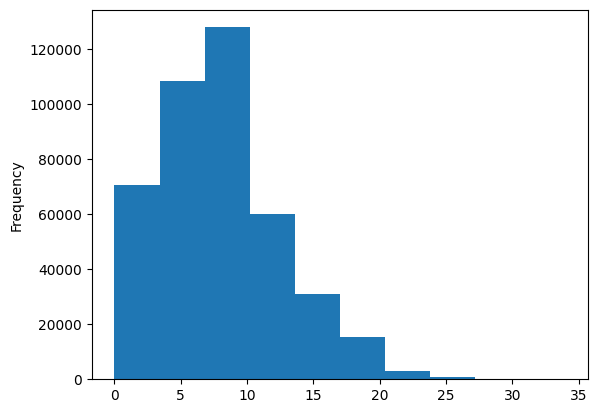

In [44]:
# Distribution of stopwords visually
temp['stop_words'].plot(kind= 'hist')

The data contains alot of stopwords (some rows contains more than 30 stopwords!). There's a visible right-sided skew. We need to take care when we remove some stop words as some of them may become empty given how much we might remove from a tweet.

#### Make the Training and Test sets

We saw before in the dataset that there were 686 complete duplicates in the original dataset. We will remove those now. We will retain the tweet duplicates with multiple emotional attributions.

In [45]:
# Remove Duplicated values from Full Dataset before split

index = data[data.duplicated() == True].index
data.drop(index, axis = 0, inplace = True)
data.reset_index(inplace=True, drop = True)

In [46]:
data.duplicated().sum()

0

In [47]:
X = data['text']
y = data[['label', 'emotion']]

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [48]:
print(x_train.shape)
print(x_test.shape)

(332898,)
(83225,)


#### Data Leakage

Let us also check for data leakage - are some tweets in both the training and test datasets?




In [49]:
def df_difference(df1, df2, which=None):
    """Find rows which are different/same between two DataFrames."""

    # Combine the two DataFrames using a merge operation, with the
    # indicator parameter set to True. This adds a column called _merge
    # to the resulting DataFrame, which indicates the source of each row.
    comparison_df = df1.merge(
        df2,
        indicator=True,
        how='outer'
    )

    # Filter the merged DataFrame based on the value of _merge. If which
    # is not specified, return all rows where _merge is not 'both'.
    # Otherwise, return all rows where _merge has the specified value
    # For our purposes, it will be 'both' so the ones in common.
    if which is None:
        diff_df = comparison_df[comparison_df['_merge'] != 'both']
    else:
        diff_df = comparison_df[comparison_df['_merge'] == which]

    # Return the filtered DataFrame
    return diff_df

In [50]:
temp1 = pd.DataFrame(x_train.copy())
temp2 = pd.DataFrame(x_test.copy())
both = df_difference(temp1, temp2, which='both')
both

,text,_merge
1051,i abhor lies of simple denial or baseless accu...,both
1064,i absolutely adore the change of seasons and w...,both
1072,i absolutely cannot wait to feel this sweet ba...,both
1074,i absolutely detest feeling stressed,both
1248,i ache all over feel overwhelmed by everything...,both
...,...,...
407278,when,both
407279,when,both
407280,when,both
408178,when i was at school,both


There are around 7125 tweets that are common to both the training and test sets. These will be retained as we will see how the models respond to data in the training data appearing in the test set.

#### Pipeline

Let us begin the preprocessing pipeline on the text.

In [52]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [53]:
# Start defining methods for data cleaning

stop_words = set(stopwords.words("english"))
lemmatizer= WordNetLemmatizer()

In [54]:
# Lemmatize the tweet
def lemmatization(text):
    lemmatizer= WordNetLemmatizer()
    text = text.split()
    text=[lemmatizer.lemmatize(y) for y in text]

    return " " .join(text)

# Get rid of stopwords
def remove_stop_words(text):
    Text=[i for i in str(text).split() if i not in stop_words]
    return " ".join(Text)

# Get rid of the numeric characters
def no_num(text):
    text=''.join([i for i in text if not i.isdigit()])
    return text

# Make all the text lowercase
def lower_case(text):
    text = text.split()
    text=[y.lower() for y in text]

    return " " .join(text)

def no_punc(text):
    # Remove punctuations
    text = re.sub('[%s]' % re.escape("""!"#$%&'()*+,،-./:;<=>؟?@[\]^_`{|}~"""), ' ', text)
    text = text.replace('؛',"", )

    # Remove extra whitespace
    text = re.sub('\s+', ' ', text)
    text =  " ".join(text.split())
    return text.strip()


In [55]:
def preprocess_tweet(tweet):
    tweet = lower_case(tweet)
    tweet = remove_stop_words(tweet)
    tweet = no_num(tweet)
    tweet = no_punc(tweet)
    tweet = lemmatization(tweet)
    return tweet


Lets test this preprocessing setup.

In [56]:
example_tweet1 = "Hello world! My name is Jonathan! @Jonathan on Twitter."
print(f"Example tweet: {example_tweet1}")
print(f"Preprocessed tweet: {preprocess_tweet(example_tweet1)}")

Example tweet: Hello world! My name is Jonathan! @Jonathan on Twitter.
Preprocessed tweet: hello world name jonathan jonathan twitter


In [57]:
example_tweet2 = "calling all surfers rn send ur dgits to @maryparker, lets go shoppin"
print(f"Example tweet: {example_tweet2}")
print(f"Preprocessed tweet: {preprocess_tweet(example_tweet2)}")

Example tweet: calling all surfers rn send ur dgits to @maryparker, lets go shoppin
Preprocessed tweet: calling surfer rn send ur dgits maryparker let go shoppin


In [58]:
example_tweet3 = "me me me me when its all about me"
print(f"Example tweet: {example_tweet3}")
print(f"Preprocessed tweet: {preprocess_tweet(example_tweet3)}")

Example tweet: me me me me when its all about me
Preprocessed tweet: 


Here, we touch upon a couple instances where the preprocessing may be an issue. First, the preprocessing steps do well with properly formed sentences that may have punctutation and something resembling normal sentence structure (Example Tweet 1).

However, there are some holes in this capacity. We see that with Example Tweet 2, the preprocessing doesn't manage to do well with processing abbreviations (see '*rn*') or with misspelled words (see '*dgits*') which generally populate Tweets due to their potential for informal speech.

Some tweets will be exceptionally short as well and if the preprocessing removes their content entirely (via stopwords; see Example Tweet 3), we are left with an empty or null sentence.



---

Let's move forward with a way to at least handle the empty sentences that may cause problems.

In [59]:
# If there's nothing left from removing all of the above
# Especially stopwords then we will remove the small tweet
# That is left (modular) from the dataframe

def no_small_tweets(df):
    df['text'] = df['text'].apply(lambda x: np.nan if len(str(x).split()) < 2 else x)
    return df

Finally, let's set the preprocessing to work on all the tweets we have.

In [60]:
def preprocess_all_tweets (df):
    df.text=df.text.apply(lambda tweet : lower_case(tweet))
    df.text=df.text.apply(lambda tweet : remove_stop_words(tweet))
    df.text=df.text.apply(lambda tweet : no_num(tweet))
    df.text=df.text.apply(lambda tweet : no_punc(tweet))
    df.text=df.text.apply(lambda tweet : lemmatization(tweet))
    return df

In [61]:
train = pd.DataFrame(x_train.copy())
train.head()

,text
153185,i have discovered is that people are hungry to...
184298,im feeling quite dazed this morning a lot happ...
159477,i feel like it was a very successful project
69778,i get home from my soul sucking nightmare job ...
102441,id never been to such a weird place like that ...


In [62]:
%time train = preprocess_all_tweets(train)
temp.head()

CPU times: user 20.6 s, sys: 104 ms, total: 20.7 s
Wall time: 20.9 s


,text,label,emotion,character_count,stop_words
0,i feel awful about it too because it s my job ...,0,sadness,112,16
1,im alone i feel awful,0,sadness,21,1
2,ive probably mentioned this before but i reall...,1,joy,152,12
3,i was feeling a little low few days back,0,sadness,40,4
4,i beleive that i am much more sensitive to oth...,2,love,99,8


In [63]:
# Filter rows where the 'text' column contains tweets with fewer than 2 words
# Meaning, we filter the tweets out that are just a blank or just one word
short_tweets = train[train['text'].apply(lambda x: len(str(x).split()) < 2)]

# Print the short tweets
print(short_tweets)
print(train.shape)

print(short_tweets.shape)

             text
299056  alcoholic
408493           
219909     murder
216556       film
143198      child
...           ...
349084      guilt
348114     hostel
124338    someone
45771        salo
66668      school

[137 rows x 1 columns]
(332898, 1)
(137, 1)


In [64]:
%time train = no_small_tweets(train)

nan_indexes = train[train.isnull().any(axis=1)].index

print("Indexes of dropped rows:")
print(nan_indexes)


CPU times: user 238 ms, sys: 0 ns, total: 238 ms
Wall time: 238 ms
Indexes of dropped rows:
Index([299056, 408493, 219909, 216556, 143198,  74977,  32341,  22618, 190601,
       230853,
       ...
       402964, 160074, 193532, 356468,  30881, 349084, 348114, 124338,  45771,
        66668],
      dtype='int64', length=137)


In [65]:
train.isna().sum()
train = train.dropna()
print(train.shape)
print(train.isna().sum())

(332761, 1)
text    0
dtype: int64


In [66]:
print(y_train.shape)
y_train = y_train.drop(index=nan_indexes)

print(y_train.shape)

(332898, 2)
(332761, 2)


We've dropped the shortest tweets from the training data. Let's repeat this for the test data.

In [67]:
test = pd.DataFrame(x_test.copy())
%time test = preprocess_all_tweets(test)


CPU times: user 4.92 s, sys: 32.2 ms, total: 4.96 s
Wall time: 5.02 s


In [68]:
print(test.shape)
short_tweets = test[test['text'].apply(lambda x: len(str(x).split()) < 2)]
print(short_tweets.shape)

%time test = no_small_tweets(test)

nan_indexes = test[test.isnull().any(axis=1)].index



(83225, 1)
(27, 1)
CPU times: user 62.1 ms, sys: 0 ns, total: 62.1 ms
Wall time: 62 ms


In [69]:
test.head()

,text
250909,dont agree feel he sincere acting good faith g...
320840,feeling shitty didnt bike today shitty
62858,sort numb feeling powerlessness care took prot...
384802,feel longing everything
69147,im sure feel ashamed embarrassed take medicati...


In [70]:
test = test.dropna()
print(test.shape)

(83198, 1)


In [71]:
print(y_test.shape)
y_test = y_test.drop(index=nan_indexes)

print(y_test.shape)

(83225, 2)
(83198, 2)


## Modeling

We'll start the modeling process by constructing a method that will initialize a Pipeline for a model that is trained on the training data. We can access our model from the Pipeline and see how well it predicts the emotions of the unseen tweets.

We will also utilize the F1 score as our metric of choice outside of test accuracy for evaluating the models.

In [73]:

from sklearn.linear_model import LogisticRegression

from sklearn.metrics import accuracy_score,confusion_matrix, classification_report
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score

In [74]:
train_text = train['text'].values
train_emo = y_train['emotion'].values

test_text = test['text'].values
test_emo = y_test['emotion'].values

In [76]:
def train_model(model, data, targets):

    # Train a machine learning model (model) with the data (data) and labels (targets)
    # Labels have to be a list of strings.
    # Create a Pipeline object with a TfidfVectorizer and the given model

    text_clf = Pipeline([('vect',TfidfVectorizer()),
                         ('clf', model)])

    # Fit the model on the data and targets
    text_clf.fit(data, targets)
    return text_clf

In [77]:
def get_F1(trained_model,X,y):

    # Get the F1 score for the given model on the given data and targets.

    # Make predictions on the input data using the trained model

    predicted=trained_model.predict(X)

    # Calculate the F1 score for the predictions

    f1=f1_score(y,predicted, average=None)

    # Return the F1 score
    return f1

### Logistic Regression Classification

We will begin with developing a baseline model using Logistic Regression.

Note we are using the L-BFGS solver as it is faster and more efficient for our training data which is at least 300000 samples large.

In [78]:
# Train the model with the training data


%time log_reg = train_model(LogisticRegression(solver='lbfgs',random_state = 0), train_text, train_emo)

CPU times: user 39.6 s, sys: 6.54 s, total: 46.1 s
Wall time: 28.8 s


Let's give the model an example. We'll use a single sentence for a simple one.

In [79]:
example = preprocess_tweet('Why did you do this, you have ruined everything!')
example

'this ruined everything'

In [80]:
y_pred=log_reg.predict([example])
y_pred

array(['anger'], dtype=object)

It's done a decent job of using the preprocessed text to ascertain the emotion of it.

In [81]:
emotion_index = ['anger', 'fear', 'joy', 'love', 'sadness', 'surprise']

array(['joy', 'surprise', 'sadness', 'love', 'fear', 'anger'],
      dtype=object)

In [83]:
y_pred=log_reg.predict(test_text)

# Calculate the accuracy
log_reg_accuracy = accuracy_score(test_emo, y_pred)
print('Accuracy: ', log_reg_accuracy,'\n')

# F1 scores for each emotion
f1_Score = get_F1(log_reg,test_text,test_emo)
pd.DataFrame(f1_Score, index=emotion_index, columns=['F1 score'])

Accuracy:  0.9002139474506599 



,F1 score
anger,0.898477
fear,0.849944
joy,0.926319
love,0.788552
sadness,0.939291
surprise,0.741868


In [84]:
# Classification Report
print(classification_report(test_emo, y_pred))

              precision    recall  f1-score   support

       anger       0.90      0.90      0.90     11419
        fear       0.85      0.85      0.85      9430
         joy       0.92      0.93      0.93     28046
        love       0.82      0.76      0.79      6943
     sadness       0.93      0.94      0.94     24354
    surprise       0.78      0.71      0.74      3006

    accuracy                           0.90     83198
   macro avg       0.87      0.85      0.86     83198
weighted avg       0.90      0.90      0.90     83198



### LIME on Logistic Regression

In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=977c548e1de08205361222450cfd03f957741438c681f2536b7085d2462a6dee
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
from lime import lime_text
from lime.lime_text import LimeTextExplainer
from lime.lime_text import IndexedString,IndexedCharacters
from lime.lime_base import LimeBase
from lime.lime_text import explanation
sns.set(font_scale=1.3)
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:

# Positive Example
explainer_LR = LimeTextExplainer(class_names=log_reg.classes_)
idx  = 610
print("Actual Text : ", test_text[idx])
print("Prediction : ", log_reg.predict(test_text)[idx])
print("Actual :     ", test_emo[idx])
exp = explainer_LR.explain_instance(test_text[idx], log_reg.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  feel like total pushover moment anyone know know pushover generous willing give benefit doubt pushover
Prediction :  joy
Actual :      joy


In [ ]:
# Negative Example

idx  = 622
print("Actual Text : ", test_text[idx])
print("Prediction : ", log_reg.predict(test_text)[idx])
print("Actual :     ", test_emo[idx])
exp = explainer_LR.explain_instance(test_text[idx], log_reg.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  woke today feeling bit agitated sleeping much
Prediction :  anger
Actual :      fear


In [85]:
check_dup = pd.DataFrame(test_text, columns=['text'])
check_dup

,text
0,dont agree feel he sincere acting good faith g...
1,feeling shitty didnt bike today shitty
2,sort numb feeling powerlessness care took prot...
3,feel longing everything
4,im sure feel ashamed embarrassed take medicati...
...,...
83193,also believe feeling anything anyone worthless...
83194,feel strange sensation
83195,wake feeling doubtful needing release
83196,im using desk first time year im feeling like ...


In [86]:

duplicates = check_dup[check_dup.duplicated()]
duplicates

,text
1286,feel incredibly helpless cant even stand
2240,feel stupid
2840,feel lame
2892,feel vain
3033,feel lucky
...,...
83098,sleeping beauty week except night temperature ...
83125,know thought negative feeling helpless know
83139,im trying something often look whole problem f...
83143,feel lucky


In [ ]:
print(duplicates.iloc[4])

# Find all rows where the 'text' column matches the first row's text
matching_duplicates = duplicates[duplicates['text'] == duplicates.iloc[4]['text']]

# Print all matching rows
print(matching_duplicates)

# Get the index of the first matching duplicate
dup_idx = matching_duplicates.index.tolist()
print(dup_idx)

text    feel lucky
Name: 3033, dtype: object
             text
3033   feel lucky
11973  feel lucky
12074  feel lucky
15490  feel lucky
25136  feel lucky
52188  feel lucky
62185  feel lucky
83143  feel lucky
[3033, 11973, 12074, 15490, 25136, 52188, 62185, 83143]


These words, when preprocessed ARE effectively duplicates. But they had somewhat different starts yet potentially the same emotions.

In [ ]:
testlist=test.iloc[dup_idx].index.tolist()

In [ ]:
y_test.iloc[dup_idx]

,label,emotion
374205,1,joy
371,1,joy
5019,1,joy
349151,1,joy
100557,1,joy
36206,1,joy
174956,1,joy
331777,1,joy


As we can see, in this case, the shorter preprocessed text 'feel lucky' has the same emotions.

In [ ]:
x_test.loc[testlist]

,text
374205,i feel lucky that i can
371,i do feel lucky
5019,i feel very very very lucky
349151,i should feel so lucky
100557,i feel so lucky to do what i do
36206,i feel so lucky
174956,i feel so lucky to have
331777,i feel so very lucky


Furthermore, they have texts with different starts.

However, what if we looked at texts with the same preprocessed text yet different emotions?

In [ ]:
test[test['text'] == 'feel incredibly helpless cant even stand']

,text
31158,feel incredibly helpless cant even stand
349234,feel incredibly helpless cant even stand


In [ ]:
# Text in the test set before preprocessing
x_test.loc[[31158,349234]]

,text
31158,i feel so incredibly helpless that i cant even...
349234,i feel so incredibly helpless that i cant even...


In [ ]:
test.loc[349234][0]

'feel incredibly helpless cant even stand'

In [ ]:
# Emotions ascribed to the unprocessed text
y_test.loc[[31158,349234]]

,label,emotion
31158,4,fear
349234,0,sadness


We have here a case where the text is the same, yet there are different emotions ascribed to them.

We'll try two indices.

In [ ]:
# Duplicate 1
explainer_LR = LimeTextExplainer(class_names=log_reg.classes_)
pos  = 31158
print("Actual Text : ", test.loc[pos][0])
print("Prediction : ", log_reg.predict(test.loc[pos])[0])
print("Actual :     ", y_test.loc[pos]['emotion'])
exp = explainer_LR.explain_instance(test.loc[pos][0], log_reg.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  feel incredibly helpless cant even stand
Prediction :  sadness
Actual :      fear


In [ ]:
# Duplicate 2

pos  = 349234
print("Actual Text : ", test.loc[pos][0])
print("Prediction : ", log_reg.predict(test.loc[pos])[0])
print("Actual :     ", y_test.loc[pos]['emotion'])
exp = explainer_LR.explain_instance(test.loc[pos][0], log_reg.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  feel incredibly helpless cant even stand
Prediction :  sadness
Actual :      sadness


Ultimately, the model will stick to one output for every duplicate case even if they have different outcomes.

We'll try one other example - a leakage one.

In [ ]:
both.head()

,text,_merge
1051,i abhor lies of simple denial or baseless accu...,both
1064,i absolutely adore the change of seasons and w...,both
1072,i absolutely cannot wait to feel this sweet ba...,both
1074,i absolutely detest feeling stressed,both
1248,i ache all over feel overwhelmed by everything...,both


Going back to our data leakage point, we have some sentences that are in both the training and test set. In both cases, they should have the same preprocessing.

In [87]:
leak = "i abhor lies of simple denial or baseless accusations i feel admiration for lies that weave in upon themselves self supporting structures of untruths that are internally consistent and difficult to peel apart like grapes"

In [88]:
print("X_train:\n",x_train[x_train == leak],"\n")
print("X_test:\n",x_test[x_test==leak],"\n")

X_train:
 15391    i abhor lies of simple denial or baseless accu...
Name: text, dtype: object 

X_test:
 49696    i abhor lies of simple denial or baseless accu...
Name: text, dtype: object 



In [ ]:
# Train
print("Text: ", train.loc[15391][0])
print("Emotion: ", y_train.loc[15391][1])

Text:  abhor lie simple denial baseless accusation feel admiration lie weave upon self supporting structure untruth internally consistent difficult peel apart like grape
Emotion:  joy


In [ ]:
# Test
print("Text: ", test.loc[49696][0])
print("Emotion: ", y_test.loc[49696][1])

Text:  abhor lie simple denial baseless accusation feel admiration lie weave upon self supporting structure untruth internally consistent difficult peel apart like grape
Emotion:  love


The leaked text here has a difference in emotion. Therefore, let's take a look at the results when tested.

In [ ]:
# Leakage

pos  = 49696
print("Actual Text : ", test.loc[pos][0])
print("Prediction : ", log_reg.predict(test.loc[pos])[0])
print("Actual :     ", y_test.loc[pos]['emotion'])
exp = explainer_LR.explain_instance(test.loc[pos][0], log_reg.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  abhor lie simple denial baseless accusation feel admiration lie weave upon self supporting structure untruth internally consistent difficult peel apart like grape
Prediction :  joy
Actual :      love


As you can see, the logistic regression model has been confounded a little by the data leakage.

### XGBoost

In [ ]:
pip install xgboost


In [ ]:
train_label = y_train['label'].values
test_label = y_test['label'].values

In [ ]:
import xgboost as xgb

# Train XGBoost model with training data


%time XGB = train_model(xgb.XGBClassifier(n_estimators=100, max_depth=10, random_state=0), train_text, train_label)

CPU times: user 26min 9s, sys: 5.06 s, total: 26min 15s
Wall time: 16min 51s


Though it is preferable to utilize the GPU backend to help speed up calculations, for some reason, the calculations using `tree_method = 'GPU_hist'` don't seem to accurately predict the values - it will default to one or two different emotions.

Therefore, we must rely on the CPU to run these calculations.

In [ ]:
newexample = preprocess_tweet('You think I have found trash? On the contrary! I have found treasure!')
newexample

'think found trash contrary found treasure'

In [ ]:
examplepred = XGB.predict([example])
[emotion_map[pred] for pred in examplepred]

['joy']

It's done a good job of ascertaining the emotion from the preprocessed tweet.

In [ ]:
# Test the model with the test data
y_pred=XGB.predict(test_text)


XGB relies on the numeric labels so we've brought back the emotion map from earlier to map the numeric labels back for easier interpretability.

In [89]:
emotion_map

{0: 'sadness', 1: 'joy', 2: 'love', 3: 'anger', 4: 'fear', 5: 'surprise'}

In [ ]:
# Mapping XGBoost predictions to emotions
y_pred_emotions = [emotion_map[pred] for pred in y_pred]

In [ ]:


#calculate the accuracy
XGB_accuracy = accuracy_score(test_emo, y_pred_emotions)
print('Accuracy: ', XGB_accuracy,'\n')

#calculate the F1 score
f1_Score = get_F1(XGB, test_text, test_label)

f1_score_df = pd.DataFrame(f1_Score, index=[emotion_map[i] for i in range(len(f1_Score))], columns=['F1 score'])
print(f1_score_df)

Accuracy:  0.8940719728839636 

          F1 score
sadness   0.938654
joy       0.914469
love      0.811438
anger     0.896847
fear      0.837817
surprise  0.744668


In [ ]:
print(classification_report(test_emo, y_pred_emotions))


              precision    recall  f1-score   support

       anger       0.92      0.87      0.90     11419
        fear       0.83      0.85      0.84      9430
         joy       0.94      0.89      0.91     28046
        love       0.74      0.90      0.81      6943
     sadness       0.94      0.93      0.94     24354
    surprise       0.68      0.82      0.74      3006

    accuracy                           0.89     83198
   macro avg       0.84      0.88      0.86     83198
weighted avg       0.90      0.89      0.90     83198



### LIME on XGB

In [ ]:
#pip install lime

In [ ]:
from lime import lime_text
from lime.lime_text import LimeTextExplainer
from lime.lime_text import IndexedString,IndexedCharacters
from lime.lime_base import LimeBase
from lime.lime_text import explanation
sns.set(font_scale=1.3)
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [ ]:
## Take it down
#explainer_LR = LimeTextExplainer(class_names=RF.classes_)
#idx  = 20
#print("Actual Text : ", test_text[idx])
#print("Prediction : ", RF.predict(test_text)[idx])
#print("Actual :     ", test_emo[idx])
#exp = explainer_LR.explain_instance(test_text[idx], RF.predict_proba,top_labels=5)
#exp.show_in_notebook()

In [ ]:
from lime.lime_text import LimeTextExplainer

# Positive Example

# Create a LIME text explainer using the class names from the emotion mapping
explainer_LR = LimeTextExplainer(class_names=[emotion_map[i] for i in range(len(emotion_map))])

# Choose an index from your test set
idx  = 622

# Print the actual text, predicted emotion, and actual label
print("Actual Text : ", test_text[idx])
print("Prediction : ", emotion_map[XGB.predict(test_text[idx:idx+1])[0]])  # Adjust the prediction for the specific index
print("Actual :     ", test_emo[idx])

# Explain the prediction for the given test instance
exp = explainer_LR.explain_instance(test_text[idx], XGB.predict_proba, top_labels=5)

# Show the explanation in the notebook
exp.show_in_notebook()

Actual Text :  woke today feeling bit agitated sleeping much
Prediction :  fear
Actual :      fear


In [ ]:

# Negative example

idx  = 610

print("Actual Text : ", test_text[idx])
print("Prediction : ", emotion_map[XGB.predict(test_text[idx:idx+1])[0]])  # Adjust the prediction for the specific index
print("Actual :     ", test_emo[idx])

exp = explainer_LR.explain_instance(test_text[idx], XGB.predict_proba, top_labels=5)

exp.show_in_notebook()

Actual Text :  feel like total pushover moment anyone know know pushover generous willing give benefit doubt pushover
Prediction :  love
Actual :      joy


Now we'll try the duplicates and the leakage case.

In [ ]:
# XGB Duplicates 1
explainer_LR = LimeTextExplainer(class_names=[emotion_map[i] for i in range(len(emotion_map))])

pos  = 31158
print("Actual Text : ", test.loc[pos][0])
print("Prediction : ", emotion_map[XGB.predict(test.loc[pos])[0]])
print("Actual :     ", y_test.loc[pos]['emotion'])
exp = explainer_LR.explain_instance(test.loc[pos][0], XGB.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  feel incredibly helpless cant even stand
Prediction :  fear
Actual :      fear


In [ ]:
pos  = 349234
print("Actual Text : ", test.loc[pos][0])
print("Prediction : ", emotion_map[XGB.predict(test.loc[pos])[0]])
print("Actual :     ", y_test.loc[pos]['emotion'])
exp = explainer_LR.explain_instance(test.loc[pos][0], XGB.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  feel incredibly helpless cant even stand
Prediction :  fear
Actual :      sadness


Note that the XGB model WAS conflicted on whether or not it was fear or sadness.

In [ ]:
# Leakage

pos  = 49696
print("Actual Text : ", test.loc[pos][0])
print("Prediction : ", emotion_map[XGB.predict(test.loc[pos])[0]])
print("Actual :     ", y_test.loc[pos]['emotion'])
exp = explainer_LR.explain_instance(test.loc[pos][0], XGB.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  abhor lie simple denial baseless accusation feel admiration lie weave upon self supporting structure untruth internally consistent difficult peel apart like grape
Prediction :  love
Actual :      love


Here it actually got it right. Furthermore, the other case - 'joy' - was high in probability, indicating that it found it as a close second or even as a probability that existed in part due to its training.

## BiLSTM

We'll begin our preparations for the bidirectional LSTM model. We'll start by preprocessing and reprocessing the data for input.

In [90]:
# Let's remake our training and validation set..

L_train, L_val, o_train, o_val = train_test_split(train, y_train, test_size=0.25, random_state=42)

In [91]:
print(f"Original training dataset size: {train.shape[0]}, proportion = {(train.shape[0] / data.shape[0] * 100):.4f}%")
print(f"LSTM training dataset size: {L_train.shape[0]}, proportion = {(L_train.shape[0] / data.shape[0] * 100):.4f}%")
print(f"LSTM validation dataset size: {L_val.shape[0]}, proportion = {(L_val.shape[0] / data.shape[0] * 100):.4f}%")
print(f"Test set size: {test.shape[0]}, proportion = {(test.shape[0] / data.shape[0] * 100):.4f}%")




Original training dataset size: 332761, proportion = 79.9670%
LSTM training dataset size: 249570, proportion = 59.9751%
LSTM validation dataset size: 83191, proportion = 19.9919%
Test set size: 83198, proportion = 19.9936%


Roughly a 60-20-20 split for the training, validation, and test datasets.

### LSTM Preprocessing

Let's look at our labels once again and one-hot encode them so they can be utilized by our LSTM model.

In [92]:
set(y_train.label.unique())

{0, 1, 2, 3, 4, 5}

In [93]:
sample = to_categorical(y_train['label'])

In [94]:
y_train['label'][10:20]

,label
167226,1
355120,2
134395,1
192850,1
224183,2
46519,4
75218,3
306097,2
135158,5
321836,1


In [ ]:
print(sample[10:20])

[[0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0.]]


In [95]:
cat_train = to_categorical(o_train['label'])
cat_val = to_categorical(o_val['label'])
cat_test = to_categorical(y_test['label'])

#### Tokenizing

We will make a tokenizer and fit it on all the tokens from the data.

In [96]:
tokenizer = Tokenizer(oov_token='UNK')
tokenizer.fit_on_texts(pd.concat([train['text'], test['text']], axis=0))

In [97]:
sample_word_index = dict(list(tokenizer.word_index.items())[:10])

# Print the sample
print(sample_word_index)

{'UNK': 1, 'feel': 2, 'feeling': 3, 'like': 4, 'im': 5, 'really': 6, 'time': 7, 'know': 8, 'get': 9, 'little': 10}


In [98]:
tokenizer.document_count

415959

In [99]:
# Example of a word from the tokenizer
tokenizer.word_index['every']

62

In [100]:
# We'll convert a preprocessed text into a list of indexes
print(L_train['text'][0])
print(tokenizer.texts_to_sequences(L_train['text'][0].split()))


feel awful job get position succeed happen
[[2], [360], [192], [9], [949], [2745], [424]]


In [101]:
tokenizer.texts_to_matrix(L_train['text'][0].split()).shape


(7, 67653)

The sentence contains 7 words. Vocabulary size is 67653.


In [102]:
import time

In [103]:
start_time = time.time()

sequences_train = tokenizer.texts_to_sequences(L_train['text'])
sequences_test = tokenizer.texts_to_sequences(test['text'])
sequences_val = tokenizer.texts_to_sequences(L_val['text'])

end_time = time.time()

print(f"Time taken = {end_time - start_time} seconds")

Time taken = 4.791166305541992 seconds


#### Padding

We need to pad the sequences so that they all have the same length. We'll pad them so they match the longest sequence.

In [104]:
maxlen1 = max([len(seq) for seq in sequences_train])
print(maxlen1)

maxlen2 = max([len(seq) for seq in sequences_val])
print(maxlen2)

maxlen3 = max([len(seq) for seq in sequences_test])
print(maxlen3)
max_seq = max([maxlen1,maxlen2,maxlen3])
print(f"Max length sequence = {max_seq}")

79
44
46
Max length sequence = 79


Longest length we found for sequence was 79.

In [105]:
X_seq_train = pad_sequences(sequences_train, maxlen=max_seq, truncating='pre')
X_seq_test = pad_sequences(sequences_test, maxlen=max_seq, truncating='pre')
X_seq_val = pad_sequences(sequences_val, maxlen=max_seq, truncating='pre')

vocabSize = len(tokenizer.index_word) + 1
print(f"Vocabulary size = {vocabSize}")

Vocabulary size = 67653


### Word Embedding for the Model (using GloVe)

We will utilize GloVe embeddings obtained from [Stanford's website](https://nlp.stanford.edu/projects/glove/) to provide pre-trained vector representations for the words in our dataset.

In [107]:
num_tokens = vocabSize
embedding_dim = 200 # Latent factors or features
hits = 0
misses = 0
embeddings_index = {}

The GloVe embeddings have been stored on the Google Drive for easier, persistent access.

In [108]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


Some of the words in tweets might not fit.

In [109]:
# Read word vectors
glove_path = "/content/drive/MyDrive/glove.6B.200d.txt"

with open(glove_path) as f:
    for line in f:
        word, coefs = line.split(maxsplit=1)
        coefs = np.fromstring(coefs, "f", sep=" ")
        embeddings_index[word] = coefs
print("Found %s word vectors." % len(embeddings_index))

# Assign word vectors to our dictionary/vocabulary
embedding_matrix = np.zeros((num_tokens, embedding_dim))
for word, i in tokenizer.word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in embedding index will be all-zeros.
        # This includes the representation for "padding" and "OOV"
        embedding_matrix[i] = embedding_vector
        hits += 1
    else:
        misses += 1
print("Converted %d words (%d misses)" % (hits, misses))

Found 400000 word vectors.
Converted 48469 words (19183 misses)


Let's take a look at some of these misses.

In [114]:
missed_words = [word for word, i in tokenizer.word_index.items() if embeddings_index.get(word) is None]
# Display 10 missed words
print(missed_words[50:60])


['smoothy', 'hehehe', 'jumbleupon', 'bloggy', 'examn', 'incase', 'somthing', 'fangirl', 'dumbass', 'goosebump']


The content of some missed words for GloVe embeddings include things like other Twitter metadata / HTML attributes, slang, or even misspelled words.

### Model Architecture & Training

Let's begin constructing the bidirectional LSTM model's architecture.

In [111]:
from tensorflow.keras.optimizers import Adam, AdamW
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense, LSTM, Embedding, Bidirectional, LayerNormalization
from tensorflow.keras import Input, Model


In [112]:
X_seq_train.shape

(249570, 79)

We'll define the callbacks here.

In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5),
    EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)
]

In [ ]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


Utilizing Colab GPU to help accelerate training.

**Setup**:

- We'll include an Input layer to accept the sequences of the fixed length of 79.

- An Embedding layer that takes in the integer encoded text and looks up, in the `embedding_matrix`, the embedding vector for each word in the input. Weights were initialized with the pretrained weights from the GloVe dataset.

- Bidirectional LSTM layers with a dropout fraction of 0.2. Processes the sequence backward and forward to get context from the whole sequence.

- Layer normalization layer to normalize output from second layer to stabilize and accelerate training.

- Dense layer with 6 output units - one for each class.

In [ ]:

inputs = Input(shape=(X_seq_train.shape[1],))
x = Embedding(vocabSize, 200, weights=[embedding_matrix], trainable=False)(inputs)
x = Bidirectional(LSTM(256, dropout=0.2, return_sequences=True))(x)
x = Bidirectional(LSTM(128, dropout=0.2, return_sequences=True))(x)
x = LayerNormalization()(x)
x = Bidirectional(LSTM(128, dropout=0.2))(x)
outputs = Dense(6, activation='softmax')(x)

model = Model(inputs, outputs)
model.compile(
    loss='categorical_crossentropy',
    optimizer=AdamW(learning_rate=0.005),
    metrics=['accuracy']
)


model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 79)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ embedding (Embedding)                │ (None, 79, 200)             │      13,531,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 79, 512)             │         935,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_1 (Bidirectional)      │ (None, 79, 256)             │         656,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ layer_normalization                  │ (None, 79, 256)             │             512 │
│ (LayerNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_2 (Bidirectional)      │ (None, 256)                 │         394,240 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 6)                   │           1,542 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,519,814 (59.20 MB)

 Trainable params: 1,988,614 (7.59 MB)

 Non-trainable params: 13,531,200 (51.62 MB)

In [ ]:
pip install pydot graphviz


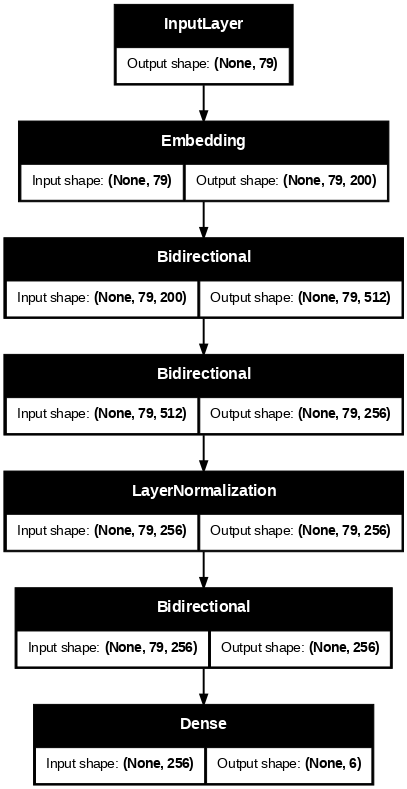

In [ ]:
# Visualizing the architecture
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True, dpi=70)

Begin training.

In [ ]:
start_time = time.time()
history = model.fit(X_seq_train,
                    cat_train,
                    validation_data=(X_seq_val, cat_val),
                    verbose=1,
                    batch_size=256,
                    epochs=20,
                    callbacks=[callbacks]
                   )

end_time = time.time()
duration = end_time-start_time
print(f"Duration of Training: {duration}")

Epoch 1/20
975/975 ━━━━━━━━━━━━━━━━━━━━ 146s 135ms/step - accuracy: 0.6241 - loss: 0.9713 - val_accuracy: 0.9322 - val_loss: 0.1158 - learning_rate: 0.0050
Epoch 2/20
975/975 ━━━━━━━━━━━━━━━━━━━━ 139s 136ms/step - accuracy: 0.9359 - loss: 0.1071 - val_accuracy: 0.9353 - val_loss: 0.1079 - learning_rate: 0.0050
Epoch 3/20
975/975 ━━━━━━━━━━━━━━━━━━━━ 142s 136ms/step - accuracy: 0.9383 - loss: 0.1026 - val_accuracy: 0.9382 - val_loss: 0.1027 - learning_rate: 0.0050
Epoch 4/20
975/975 ━━━━━━━━━━━━━━━━━━━━ 142s 136ms/step - accuracy: 0.9397 - loss: 0.0955 - val_accuracy: 0.9382 - val_loss: 0.0980 - learning_rate: 0.0050
Epoch 5/20
975/975 ━━━━━━━━━━━━━━━━━━━━ 142s 136ms/step - accuracy: 0.9382 - loss: 0.0954 - val_accuracy: 0.9386 - val_loss: 0.0986 - learning_rate: 0.0050
Epoch 6/20
975/975 ━━━━━━━━━━━━━━━━━━━━ 142s 136ms/step - accuracy: 0.9405 - loss: 0.0936 - val_accuracy: 0.9382 - val_loss: 0.0993 - learning_rate: 0.0050
Epoch 7/20
975/975 ━━━━━━━━━━━━━━━━━━━━ 132s 135ms/step - accura

Saving the model in case it needs to be loaded again.

In [ ]:
#model.save('my_model.h5')


In [ ]:
print(f"Minutes taken: {duration / 60}")

Minutes taken: 37.552618404229484


Final model trained for about 16 epoches in about 38 minutes.

### Model Results

In [ ]:
# Validation loss and accuracy
model.evaluate(X_seq_val, cat_val, verbose=1)

2600/2600 ━━━━━━━━━━━━━━━━━━━━ 36s 14ms/step - accuracy: 0.9398 - loss: 0.0935


[0.09491398185491562, 0.9397531151771545]

Validation accuracy was about 93.98%, validation loss was about 0.0949.

In [ ]:
# Test accuracy and test loss
LSTM_loss_acc = model.evaluate(X_seq_test, cat_test, verbose=1)
print(f"Test accuracy = {LSTM_loss_acc[1]}")
print(f"Test loss = {LSTM_loss_acc[0]}")

2600/2600 ━━━━━━━━━━━━━━━━━━━━ 38s 14ms/step - accuracy: 0.9400 - loss: 0.0948
Test accuracy = 0.9400826692581177
Test loss = 0.0943446084856987


Test accuracy was about 94.00%, slightly higher than validation accuracy. Test loss was 0.0943, slightly lower than the validation loss.

In [ ]:
predicted = model.predict(X_seq_test)
y_pred = predicted.argmax(axis=-1)

# Map the emotions to the numeric labels
y_pred_emotions_lstm = [emotion_map[pred] for pred in y_pred]



2600/2600 ━━━━━━━━━━━━━━━━━━━━ 36s 14ms/step


In [ ]:
print(classification_report(test_emo, y_pred_emotions_lstm))

              precision    recall  f1-score   support

       anger       0.93      0.96      0.94     11419
        fear       0.90      0.89      0.90      9430
         joy       0.92      0.99      0.96     28046
        love       0.99      0.72      0.83      6943
     sadness       0.97      0.98      0.97     24354
    surprise       0.94      0.69      0.79      3006

    accuracy                           0.94     83198
   macro avg       0.94      0.87      0.90     83198
weighted avg       0.94      0.94      0.94     83198



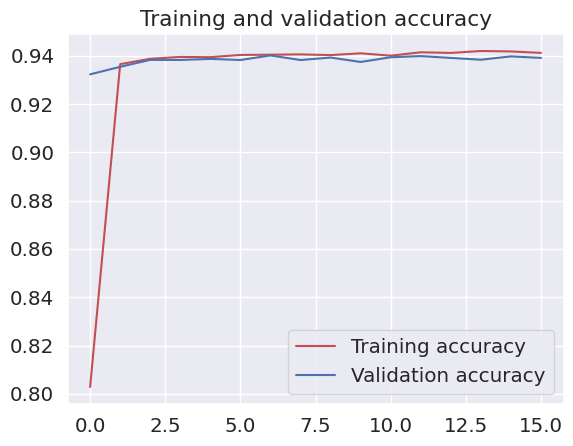

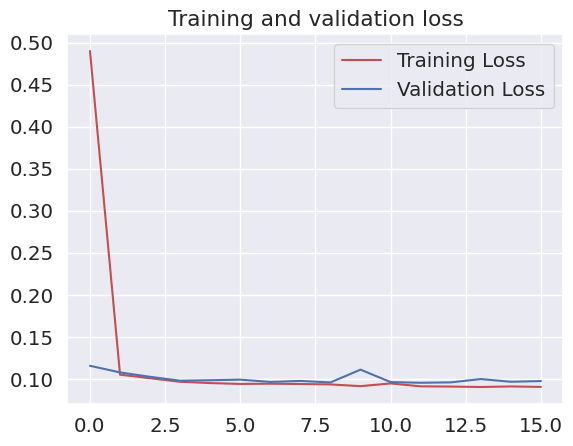

In [ ]:
# Visualize Loss & Accuracy

%matplotlib inline
import matplotlib.pyplot as plt
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Training lasts for maybe one epoch before everything flattens out. This may be in part due to the pretrained GloVe embeddings utilized for the training of the model.

## Conclusion

Let's visualize the results.

In [ ]:
pip install tabulate

In [ ]:
# Prepare the data for tabulation
model_accuracies = [
    ["Logistic Regression", log_reg_accuracy],
    ["XGBoost", XGB_accuracy],
    ["LSTM", LSTM_loss_acc[1]]
]

In [ ]:
from tabulate import tabulate
print(tabulate(model_accuracies, headers=['Models', 'Test Accuracy'], tablefmt="pretty"))


Reason we aren't using SHAP or LIME for further interpretability of the model is that SHAP is too computationally expensive to run on the whole model LSTM model. LIME can only serve to explain single instances but am unable to get it running to help interpret Sequences.